**Libraries**

In [ ]:
import os
from PIL import Image
import kagglehub
import matplotlib.pyplot as plt
from matplotlib.image import imread
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

**Functions**

In [ ]:
import os
import random
import matplotlib.pyplot as plt
from matplotlib.image import imread

def display_images_by_category(dataset_path, num_images=5):
    """
    Displays a few random images from each category in a directory structure.
    """
    try:
        categories = [d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))]
        if not categories:
            print("No categories found in the dataset path.")
            return

        for category in categories:
            category_path = os.path.join(dataset_path, category)
            image_files = [os.path.join(category_path, file) for file in os.listdir(category_path)
                           if file.lower().endswith(('.png', '.jpg', '.jpeg'))]

            if not image_files:
                print(f"No images found in category: {category}")
                continue

            # Select random images for display
            selected_images = random.sample(image_files, min(num_images, len(image_files)))

            # Plot the images in a single row
            fig, axes = plt.subplots(1, len(selected_images), figsize=(15, 5))
            fig.suptitle(f"Category: {category}", fontsize=16)

            for ax, img_path in zip(axes, selected_images):
                img = imread(img_path)
                ax.imshow(img)
                ax.set_title(os.path.basename(img_path), fontsize=10)
                ax.axis('off')

            plt.tight_layout()
            plt.show()

    except Exception as e:
        print(f"Error: {e}")


In [ ]:
def display_images(dataset_path, num_images=9):
    """
    Display a grid of images with their labels from a given dataset.
    """
    # Take 1 batch of data from the dataset
    for images, labels in dataset_path.take(1):
        images = images.numpy()
        labels = labels.numpy()

        # Integers in the range [0, 255]
        images = images.clip(0, 255)
        images = images.astype("uint8")
        break

    # Plotting setup
    grid_size = int(num_samples**0.5)
    plt.figure(figsize=(10, 10))
    plt.suptitle(title, fontsize=16)

    # Plot the images with labels
    for i in range(min(num_samples, len(images))):
        plt.subplot(grid_size, grid_size, i + 1)
        plt.imshow(images[i])
        plt.title(f"Label: {labels[i]}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

## Import Data




In [ ]:
dataset_path = kagglehub.dataset_download("ashishmotwani/tomato")
print("Path to dataset files:", dataset_path)

100%|██████████| 1.37G/1.37G [00:57<00:00, 25.5MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/ashishmotwani/tomato/versions/1


In [ ]:
import os
os.listdir(dataset_path + '/valid')

['Leaf_Mold',
 'Bacterial_spot',
 'Tomato_Yellow_Leaf_Curl_Virus',
 'Septoria_leaf_spot',
 'Late_blight',
 'Target_Spot',
 'Early_blight',
 'powdery_mildew',
 'Tomato_mosaic_virus',
 'Spider_mites Two-spotted_spider_mite',
 'healthy']

In [ ]:
train_path = dataset_path + '/train'
valid_path = dataset_path + '/valid'

## View sample images

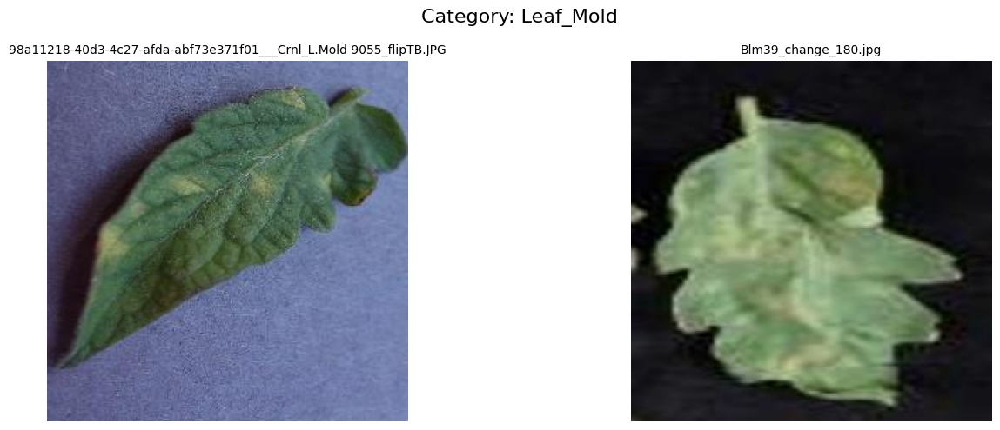

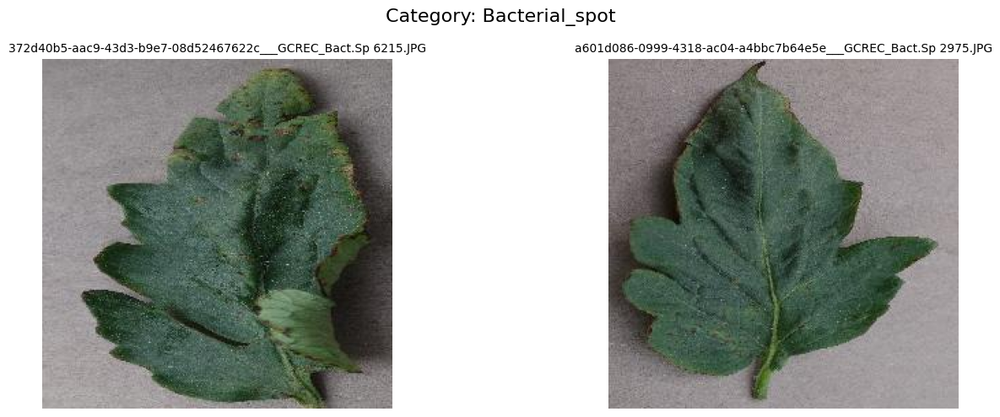

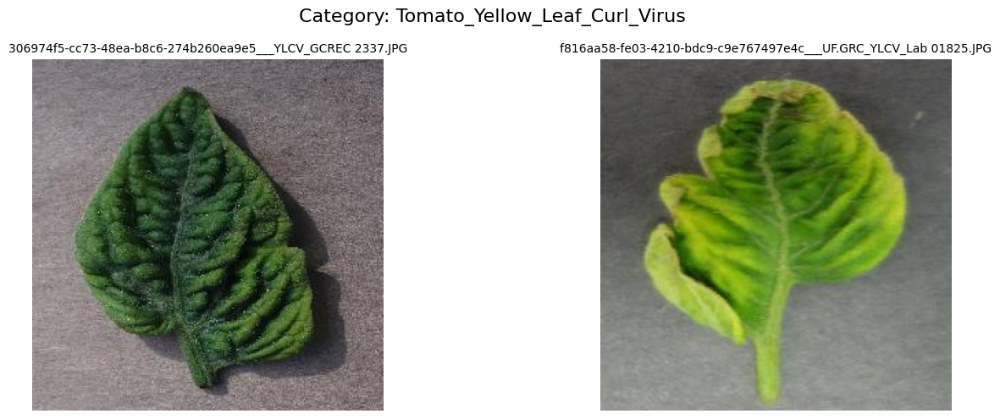

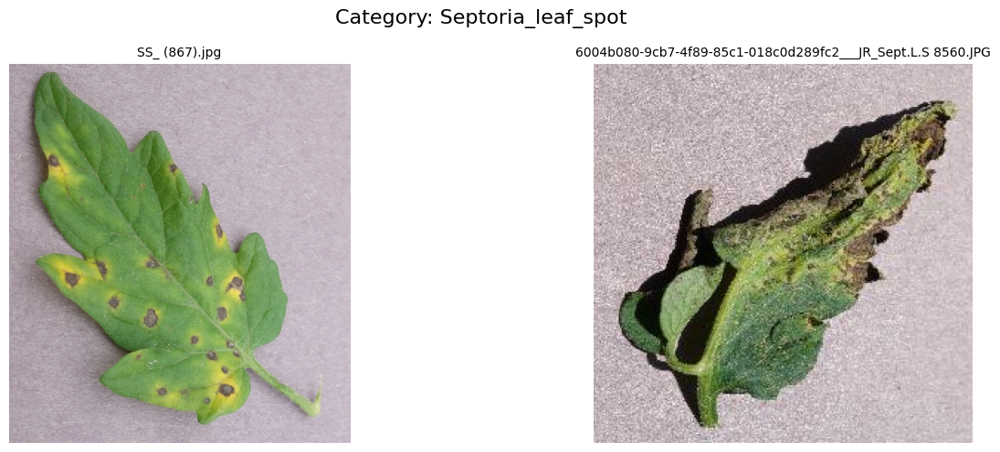

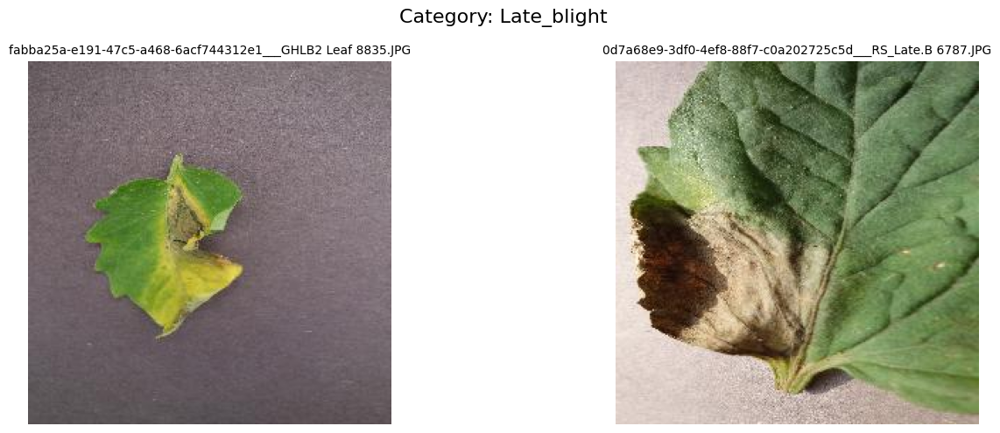

...

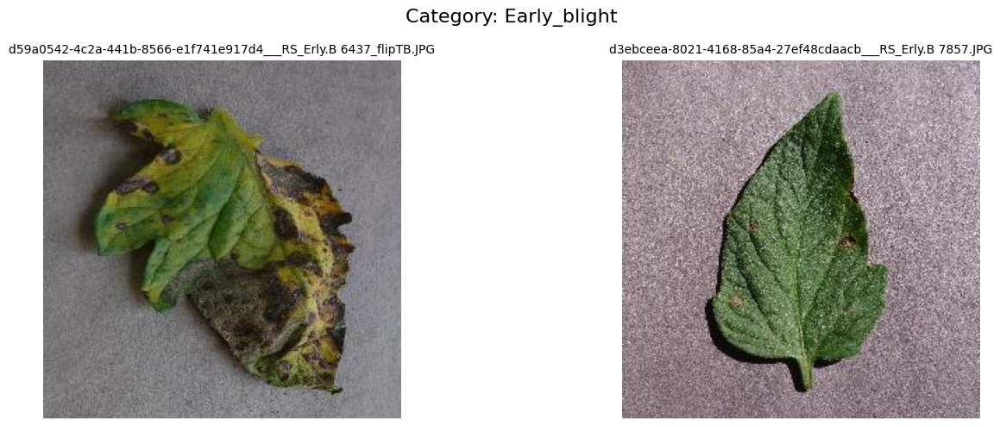

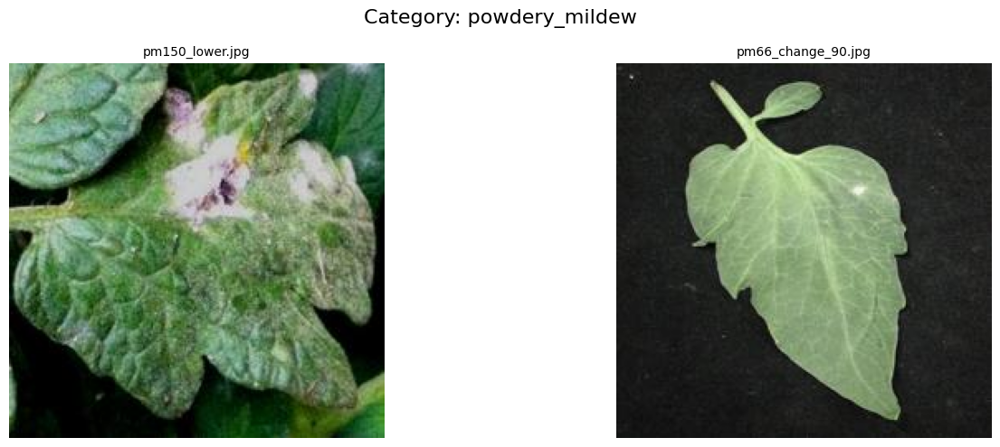

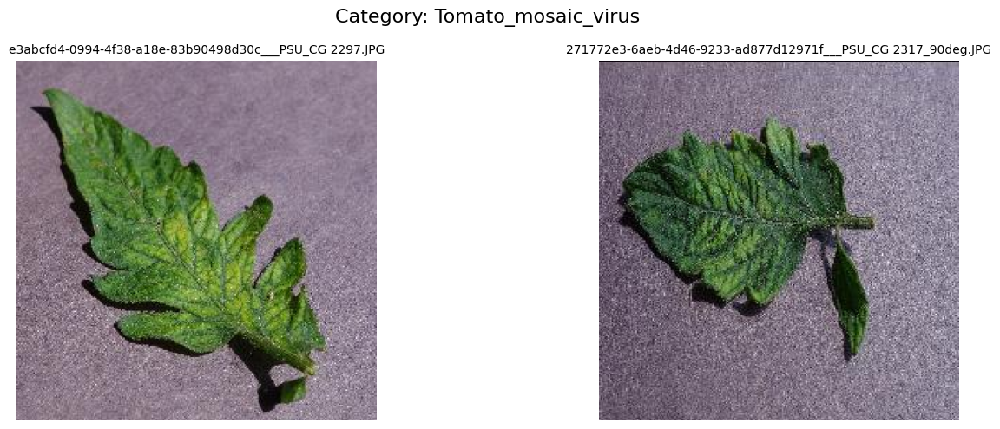

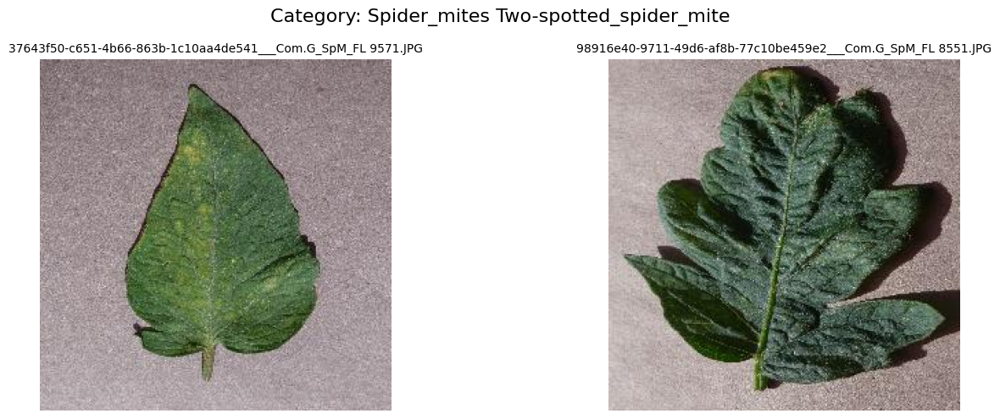

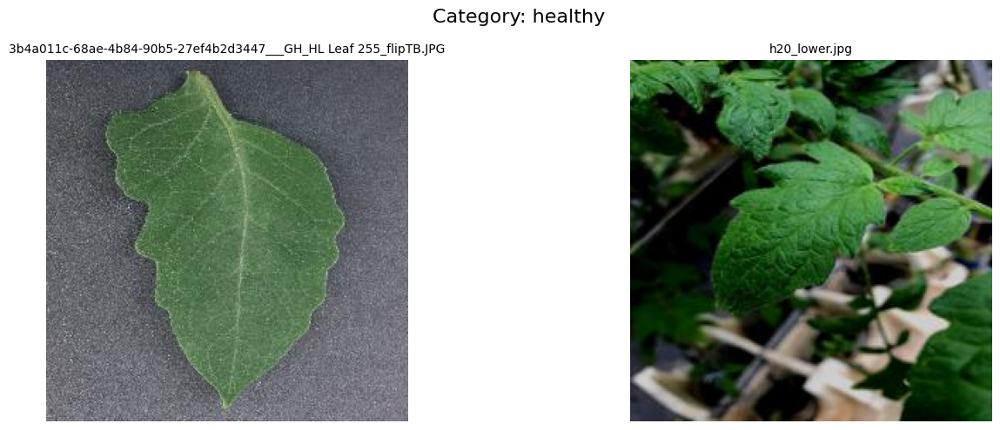

In [ ]:
display_images_by_category(train_path, num_images=2)

In [ ]:
# display_images_by_category(dataset_path, num_images=5)

In [ ]:
# View all categories in train and validation data:
for path in [train_path, valid_path]:
    print("\n",path)
    for category in os.listdir(path):
        category_path = os.path.join(path, category)
        if os.path.isdir(category_path):
            print(f"Category: {category}")
            print("Number of samples:", len(os.listdir(category_path)))
            files = os.listdir(category_path)
            # print(f"Files: {files}")


 /root/.cache/kagglehub/datasets/ashishmotwani/tomato/versions/1/train
Category: Leaf_Mold
Number of samples: 2754
Category: Bacterial_spot
Number of samples: 2826
Category: Tomato_Yellow_Leaf_Curl_Virus
Number of samples: 2039
Category: Septoria_leaf_spot
Number of samples: 2882
Category: Late_blight
Number of samples: 3113
Category: Target_Spot
Number of samples: 1827
Category: Early_blight
Number of samples: 2455
Category: powdery_mildew
Number of samples: 1004
Category: Tomato_mosaic_virus
Number of samples: 2153
Category: Spider_mites Two-spotted_spider_mite
Number of samples: 1747
Category: healthy
Number of samples: 3051

 /root/.cache/kagglehub/datasets/ashishmotwani/tomato/versions/1/valid
Category: Leaf_Mold
Number of samples: 739
Category: Bacterial_spot
Number of samples: 732
Category: Tomato_Yellow_Leaf_Curl_Virus
Number of samples: 498
Category: Septoria_leaf_spot
Number of samples: 746
Category: Late_blight
Number of samples: 792
Category: Target_Spot
Number of samples:

In [ ]:
# convert all of the images to PNG

from PIL import Image

def convert_images_to_png(directory):
    for root, _, files in os.walk(directory):
        for file in files:
            if file.lower().endswith(('.jpg', '.jpeg', '.bmp', '.gif')):  # Add other formats if needed
                filepath = os.path.join(root, file)
                try:
                    img = Image.open(filepath)
                    png_filepath = os.path.splitext(filepath)[0] + ".png"
                    img.save(png_filepath, "PNG")
                    print(f"Converted {filepath} to {png_filepath}")
                    os.remove(filepath) #remove the original file
                    print(f"Removed original file {filepath}")
                except IOError as e:
                    print(f"Error converting {filepath}: {e}")

# Example usage (replace with your dataset paths):
convert_images_to_png(train_path)
convert_images_to_png(valid_path)


Streaming output truncated to the last 5000 lines.
Converted /root/.cache/kagglehub/datasets/ashishmotwani/tomato/versions/1/valid/Early_blight/f7ab79a6-43d3-4ece-9461-43742519a221___RS_Erly.B 8290_180deg.JPG to /root/.cache/kagglehub/datasets/ashishmotwani/tomato/versions/1/valid/Early_blight/f7ab79a6-43d3-4ece-9461-43742519a221___RS_Erly.B 8290_180deg.png
Removed original file /root/.cache/kagglehub/datasets/ashishmotwani/tomato/versions/1/valid/Early_blight/f7ab79a6-43d3-4ece-9461-43742519a221___RS_Erly.B 8290_180deg.JPG
Converted /root/.cache/kagglehub/datasets/ashishmotwani/tomato/versions/1/valid/Early_blight/fc296f63-8cb3-42f1-a9c1-f6ed8e49777c___RS_Erly.B 6400_180deg.JPG to /root/.cache/kagglehub/datasets/ashishmotwani/tomato/versions/1/valid/Early_blight/fc296f63-8cb3-42f1-a9c1-f6ed8e49777c___RS_Erly.B 6400_180deg.png
Removed original file /root/.cache/kagglehub/datasets/ashishmotwani/tomato/versions/1/valid/Early_blight/fc296f63-8cb3-42f1-a9c1-f6ed8e49777c___RS_Erly.B 6400_18

### Split training and validation data and resizing the data

In [ ]:
# Load the entire dataset and reserve 20% for testing
train_dataset = tf.keras.utils.image_dataset_from_directory(
    train_path,
    image_size=(260, 260),
    batch_size=32
)

validation_dataset = tf.keras.utils.image_dataset_from_directory(
    valid_path,
    image_size=(260, 260),
    batch_size=32
)

Found 25683 files belonging to 11 classes.
Found 6653 files belonging to 11 classes.


In [ ]:
for x, y in train_dataset.take(1):
    # print("x:", x)
    print("y:", y)

y: tf.Tensor(
[ 4  6  4  2  3  4  0  0  1  0  2  1  2  8  9  8  8  5  8  4  5  9  3 10
  2  2  2  2  9  4  7  6], shape=(32,), dtype=int32)


In [ ]:
len(train_dataset), len(train_dataset)*32

(803, 25696)

In [ ]:
len(validation_dataset), len(validation_dataset)*32

(208, 6656)

In [ ]:
def display_samples(dataset, title, num_samples=9):
    """
    Display a grid of images with their labels from a given dataset.
    """
    # Take 1 batch of data from the dataset
    for images, labels in dataset.take(1):
        images = images.numpy()
        labels = labels.numpy()

        # Integers in the range [0, 255]
        images = images.clip(0, 255)
        images = images.astype("uint8")
        break

    # Plotting setup
    grid_size = int(num_samples**0.5)
    plt.figure(figsize=(10, 10))
    plt.suptitle(title, fontsize=16)

    # Plot the images with labels
    for i in range(min(num_samples, len(images))):
        plt.subplot(grid_size, grid_size, i + 1)
        plt.imshow(images[i])
        plt.title(f"Label: {labels[i]}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

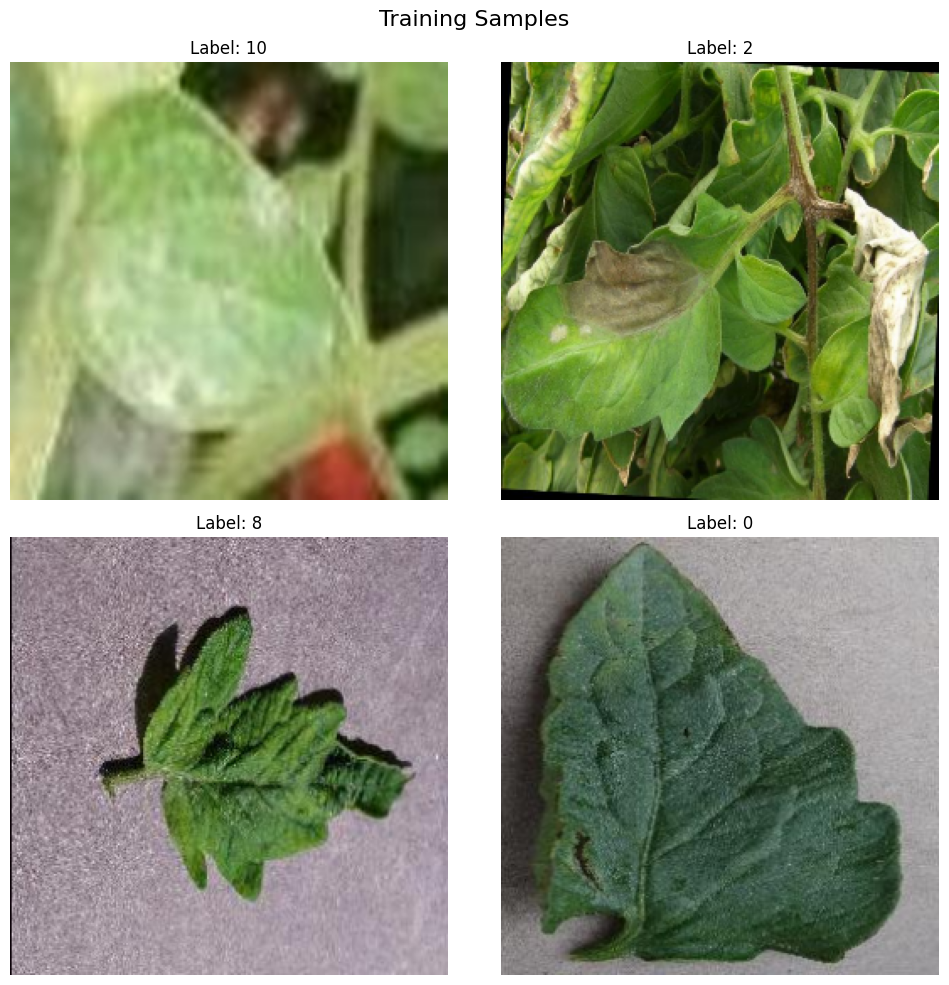

In [ ]:
display_samples(train_dataset, "Training Samples", 4)

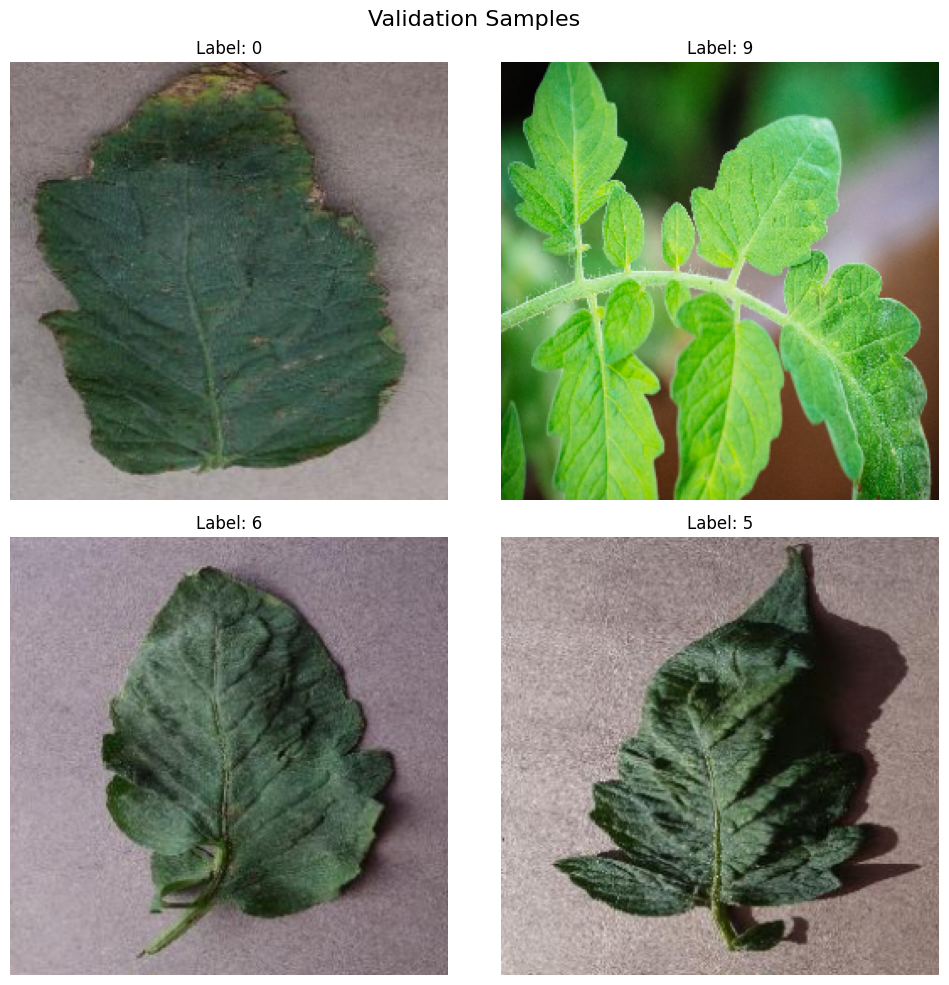

In [ ]:
display_samples(validation_dataset, "Validation Samples", 4)

## Data Augmentation

Dat augmentation is used to prevent overffing by adding variability to the training data. This medthod improve generalization by helping the model learn features that are in various different orientations, scale and position. The following transformations are applied to enhance dataset diversity:

- Geometric Transformations: Flip, rotate, crop, or resize.

- Color Adjustments: Change brightness, contrast, saturation, or apply grayscale.

- Noise Injection: Add random noise for robustness.

- Distortions: Apply random zoom, shear, or perspective transformations.

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import (
    RandomFlip, RandomRotation, RandomZoom, RandomCrop, RandomTranslation,
    Rescaling, RandomContrast, RandomBrightness
)

data_augmentation = tf.keras.Sequential([
    RandomFlip("horizontal_and_vertical"),
    RandomRotation(0.2),
    RandomZoom(0.2),
    RandomTranslation(height_factor=0.1, width_factor=0.1),
    RandomBrightness(factor=0.2),
    RandomContrast(factor=0.2),
    Rescaling(1.0 / 255)  # Normalize pixel values to [0, 1]
])

In [ ]:
# Apply data augmentation to the training dataset
train_dataset_augmented = train_dataset.map(lambda x, y: (data_augmentation(x, training=True), y))

shape (32, 260, 260, 3)


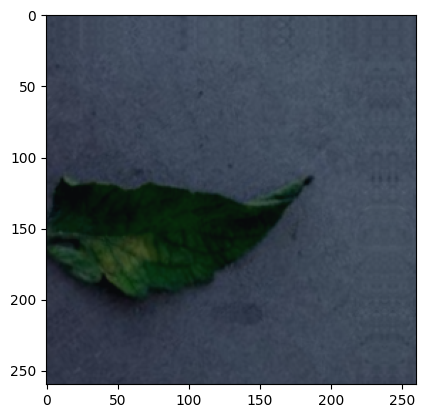

In [ ]:
for batch in train_dataset_augmented.take(1):
    print("shape", batch[0].numpy().shape)
    plt.imshow(batch[0].numpy()[0])
    plt.show()


## Label Encoding

Categorical Labels: Convert class names into integers or one-hot encoding for classification tasks.

In [ ]:
# List of categories
labels = [
    'powdery_mildew', 'Septoria_leaf_spot', 'Target_Spot', 'Leaf_Mold',
    'Tomato_mosaic_virus', 'Late_blight', 'Spider_mites Two-spotted_spider_mite',
    'Early_blight', 'Tomato_Yellow_Leaf_Curl_Virus', 'healthy', 'Bacterial_spot'
]

# Create a dictionary for label encoding
label_mapping = {name: idx for idx, name in enumerate(labels)}

print("Label Mapping:")
print(label_mapping)

Label Mapping:
{'powdery_mildew': 0, 'Septoria_leaf_spot': 1, 'Target_Spot': 2, 'Leaf_Mold': 3, 'Tomato_mosaic_virus': 4, 'Late_blight': 5, 'Spider_mites Two-spotted_spider_mite': 6, 'Early_blight': 7, 'Tomato_Yellow_Leaf_Curl_Virus': 8, 'healthy': 9, 'Bacterial_spot': 10}


In [ ]:
# Encode labels
encoded_labels = [label_mapping[label] for label in labels]

print("Encoded Labels:")
print(encoded_labels)

Encoded Labels:
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


In [ ]:
# Map encoded labels to TensorFlow dataset
train_dataset_with_labels = train_dataset_augmented.map(lambda x, y: (x, tf.one_hot(y, depth=len(labels))))

# Verify the labels
for images, labels in train_dataset_with_labels.take(1):
    print("One-hot Encoded Labels:")
    print(labels.numpy())

One-hot Encoded Labels:
[[0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [1.

In [ ]:
# One-hot encode the labels
num_classes = len(encoded_labels)

train_dataset_with_labels = train_dataset_augmented.map(
    lambda x, y: (x, tf.one_hot(y, depth=num_classes))
)

validation_dataset_with_labels = validation_dataset.map(
    lambda x, y: (x, tf.one_hot(y, depth=num_classes))
)

In [ ]:
num_classes

11

In [ ]:
for images, labels in train_dataset_with_labels.take(1):
    print(f"Image batch shape: {images.shape}")
    print(f"Label batch shape: {labels.shape}")

Image batch shape: (32, 260, 260, 3)
Label batch shape: (32, 11)


# Model Training & Validation #

In [ ]:
from tensorflow.keras import layers, models
from tensorflow.keras.applications import EfficientNetB2
from tensorflow.keras.layers import Conv2D, MaxPooling2D, BatchNormalization, Dropout, Flatten, Dense
from tensorflow.keras.models import Sequential

def add_conv_block(model, filters, conv_layers, kernel_size=(3, 3), padding="same", activation="relu", dropout_rate=0.25, pool_size=(2, 2), strides=(2, 2)):
    """
    Adds a block of convolutional layers followed by a max-pooling layer, batch normalization, and a dropout layer.
    """
    for _ in range(conv_layers):
        model.add(Conv2D(filters=filters, kernel_size=kernel_size, padding=padding, activation=activation))
        model.add(BatchNormalization())  # Add Batch Normalization after Conv layers
    # Apply MaxPooling2D only if the input dimensions are large enough
    if model.output_shape[1] >= pool_size[0] and model.output_shape[2] >= pool_size[1]:
        model.add(MaxPooling2D(pool_size=pool_size, strides=strides))
        model.add(Dropout(dropout_rate))  # Add dropout after pooling to reduce overfitting
    return model  # Return the modified model


def build_model(num_classes):
    # Use EfficientNetB2 as the base model
    base_model = EfficientNetB2(weights="imagenet", include_top=False, input_shape=(260, 260, 3))
    base_model.trainable = False  # Freeze the base model

    model = models.Sequential([
        base_model,
    ])

    # Add custom convolutional blocks after the base model, chaining the calls
    model = add_conv_block(model, filters=128, conv_layers=2)
    model = add_conv_block(model, filters=256, conv_layers=3)
    model = add_conv_block(model, filters=512, conv_layers=3)
    # Remove the last convolutional block, or adjust its parameters
    # model = add_conv_block(model, filters=512, conv_layers=3)

    # Fully connected layers
    model.add(Flatten())
    model.add(Dense(units=4096, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(units=4096, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(units=num_classes, activation="softmax"))  # Output layer with softmax for multi-class classification

    return model

# Example usage
num_classes = 11
model = build_model(num_classes)

# Compile the model
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Summary of the model
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ efficientnetb2 (Functional)          │ (None, 9, 9, 1408)          │       7,768,569 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (None, 9, 9, 128)           │       1,622,144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_13               │ (None, 9, 9, 128)           │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_12 (Conv2D)                   │ (None, 9, 9, 128)           │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_14               │ (None, 9, 9, 128)           │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 4, 4, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 4, 4, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_13 (Conv2D)                   │ (None, 4, 4, 256)           │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_15               │ (None, 4, 4, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_14 (Conv2D)                   │ (None, 4, 4, 256)           │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_16               │ (None, 4, 4, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_15 (Conv2D)                   │ (None, 4, 4, 256)           │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_17               │ (None, 4, 4, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 2, 2, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 2, 2, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_16 (Conv2D)                   │ (None, 2, 2, 512)           │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_18               │ (None, 2, 2, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_17 (Conv2D)                   │ (None, 2, 2, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 35,884,036 (136.89 MB)

 Trainable params: 28,093,963 (107.17 MB)

 Non-trainable params: 7,790,073 (29.72 MB)

In [ ]:
# Train the model
history = model.fit(
    train_dataset_with_labels,
    validation_data=validation_dataset_with_labels,
    epochs=20,
)

Epoch 1/20
803/803 ━━━━━━━━━━━━━━━━━━━━ 677s 786ms/step - accuracy: 0.0984 - loss: 4.0295 - val_accuracy: 0.0966 - val_loss: 47.7603
Epoch 2/20
803/803 ━━━━━━━━━━━━━━━━━━━━ 596s 742ms/step - accuracy: 0.1009 - loss: 3.3717 - val_accuracy: 0.1181 - val_loss: 38.5811
Epoch 3/20
803/803 ━━━━━━━━━━━━━━━━━━━━ 592s 737ms/step - accuracy: 0.1014 - loss: 3.2677 - val_accuracy: 0.1067 - val_loss: 55.7562
Epoch 4/20
803/803 ━━━━━━━━━━━━━━━━━━━━ 595s 741ms/step - accuracy: 0.1032 - loss: 3.2959 - val_accuracy: 0.1094 - val_loss: 19.1105
Epoch 5/20
803/803 ━━━━━━━━━━━━━━━━━━━━ 595s 741ms/step - accuracy: 0.1011 - loss: 3.3526 - val_accuracy: 0.0691 - val_loss: 192.0374
Epoch 6/20
803/803 ━━━━━━━━━━━━━━━━━━━━ 588s 732ms/step - accuracy: 0.1057 - loss: 3.2928 - val_accuracy: 0.1106 - val_loss: 10.3366
Epoch 7/20
803/803 ━━━━━━━━━━━━━━━━━━━━ 596s 742ms/step - accuracy: 0.1121 - loss: 3.2871 - val_accuracy: 0.0791 - val_loss: 55.6822
Epoch 8/20
803/803 ━━━━━━━━━━━━━━━━━━━━ 589s 733ms/step - accuracy: 

In [1]:
# Plot training and validation loss and accuracy
def plot_training_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(len(acc))

    plt.figure(figsize=(12, 6))

    # Plot accuracy
    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, label='Training Accuracy', marker='o')
    plt.plot(epochs, val_acc, label='Validation Accuracy', marker='o')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Plot loss
    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, label='Training Loss', marker='o')
    plt.plot(epochs, val_loss, label='Validation Loss', marker='o')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_training_history(history)

NameError: name 'history' is not defined

In [ ]:
# Evaluate the model on the validation dataset
loss, accuracy = model.evaluate(validation_dataset)
print(f"Validation Loss: {loss:.4f}")
print(f"Validation Accuracy: {accuracy:.4f}")

In [ ]:
# Compile the model with SGD optimizer
# opt = SGD(learning_rate=0.01, momentum=0.9, nesterov=True)  # Use momentum and Nesterov for better convergence
# model.compile(optimizer=opt, loss=losses.categorical_crossentropy, metrics=['accuracy'])

In [ ]:
# def build_model(num_classes):
    # Use EfficientNetB2 as the base model
#    base_model = EfficientNetB2(weights="imagenet", include_top=False, input_shape=(224, 224, 3))
#    base_model.trainable = False  # Freeze the base model

#    model = models.Sequential([
 #       base_model,
#        layers.GlobalMaxPooling2D(),
#        layers.Dense(512, activation='swish', kernel_regularizer=tf.keras.regularizers.l2(0.01)),
#        layers.BatchNormalization(),
#        layers.Dropout(0.4),
#        layers.Dense(256, activation='swish'),
#        layers.BatchNormalization(),
#        layers.Dropout(0.4),
#        layers.Dense(num_classes, activation='softmax')  # Assuming multi-class classification
#    ])
#    return model

# Compile the model
# model = build_model(num_classes)
# model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Summary of the model
# model.summary()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
# Early stopping to prevent overfitting
# early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
# history = model.fit(
 #   train_dataset_with_labels,
 #   validation_data=validation_dataset_with_labels,
 #   epochs=20,
 #   callbacks=[early_stopping]
#)